#**Project Objective**

The objective of this project is to develop an efficient and accurate model using the YOLO (You Only Look Once) algorithm to detect and classify tomato leaf conditions. This model aims to determine whether a tomato leaf is healthy or affected by one of several diseases. By automating this process, the model supports early detection and intervention, helping farmers and agricultural specialists manage crop health and potentially increase yield by addressing plant diseases promptly.

Project details:

Author: S.Deepack

Date:10/16/2024

problem statement:Build a model to determine whether a tomato leaf is healthy or affected by one of several diseases

#Approach

1.Importing neccessary Libraries

2.Importing Dataset

3.Data preparation and observation

4.Training of the model

5.Evaluation

6.Conclusion



#Importing libraries

In [1]:
import os
import cv2
import random
import pandas as pd
import matplotlib.pyplot as plt
!pip install ultralytics
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
import matplotlib.image as mpimg
!pip install gradio ultralytics
import gradio as gr


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 879.0/879.0 kB 26.1 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.7/56.7 MB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.8/319.8 kB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.7/94.7 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.5/447.5 kB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 108.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.3/73.3 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130

#Importing dataset

In [2]:
!unzip '/content/cap 2.zip'

Archive:  /content/cap 2.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
  inflating: test/images/IMG_0219_JPG.rf.c8d288f364390a28656a50ed7415713a.jpg  
  inflating: test/images/IMG_0233_JPG.rf.b27c3e2dd843cab5e0f652fd1ce5659a.jpg  
  inflating: test/images/IMG_0249_JPG.rf.412df0b52b549fc121a346eb8a957ab0.jpg  
  inflating: test/images/IMG_0277_JPG.rf.84073f240decbc79e30716373f3dd507.jpg  
  inflating: test/images/IMG_0281_JPG.rf.a29c913abceeed1ea6092ab0f2c92b0d.jpg  
  inflating: test/images/IMG_0288_JPG.rf.ca824ec09b29571c39dc6b6ee6b0f6a7.jpg  
  inflating: test/images/IMG_0299_JPG.rf.d19f0cf7d3997c407f195ae8c59cd046.jpg  
  inflating: test/images/IMG_0300_JPG.rf.9294551b97cedde7e681b52876aed944.jpg  
  inflating: test/images/IMG_0306_JPG.rf.8cfc41c387ad5f06390912b8adf4f001.jpg  
  inflating: test/images/IMG_0337_JPG.rf.c5ee563d8584973ee9fd339de59c0c8f.jpg  
  inflating: test/images/IMG_0345_JPG.rf.6d1707b20ec861a7

#Data Inspection

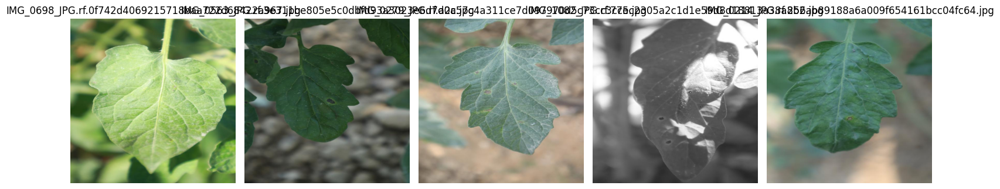

In [3]:
def visualize_random_images(train_dir, num_images=5):
  """Visualizes a specified number of random images from the training directory.

  Args:
    train_dir: The path to the training directory containing the images.
    num_images: The number of random images to visualize (default is 5).
  """

  image_files = [f for f in os.listdir(train_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
  random_images = random.sample(image_files, min(num_images, len(image_files)))

  plt.figure(figsize=(15, 5))
  for i, image_file in enumerate(random_images):
      image_path = os.path.join(train_dir, image_file)
      img = mpimg.imread(image_path)
      plt.subplot(1, num_images, i + 1)
      plt.imshow(img)
      plt.axis('off')
      plt.title(image_file)

  plt.tight_layout()
  plt.show()


# Example usage:
# Assuming 'train' is the directory containing your training images
train_dir = '/content/train/images'
visualize_random_images(train_dir)

Image: IMG_0591_JPG.rf.718f5d4ca63c76c759d986ec5170e2ab.jpg


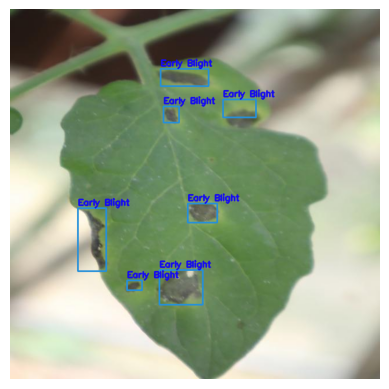

Image: IMG_0589_JPG.rf.db6205d2f4b2bbe5f0d835e04813b14f.jpg


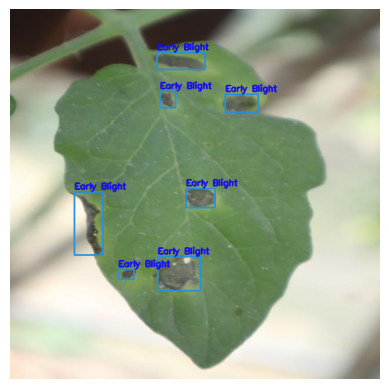

Image: IMG_0333_JPG.rf.2192b27192e0c04094e9bcd5cc1b541b.jpg


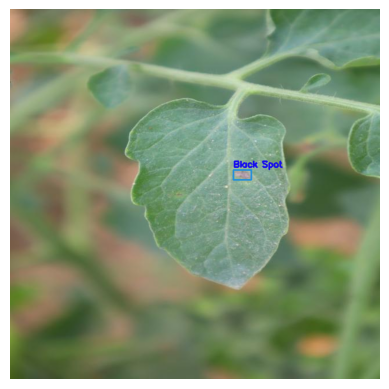

Image: IMG_0308_JPG.rf.7f72ce8905e99262c3e4cff5041c3596.jpg


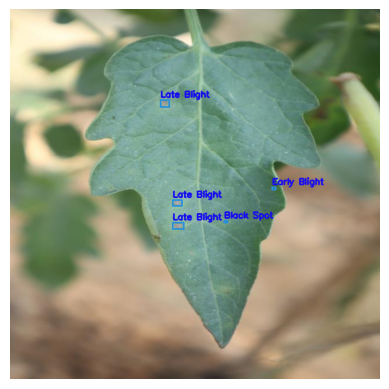

Image: IMG_0245_JPG.rf.dcdd4f1ffc6b0343f29bbe464e21b363.jpg


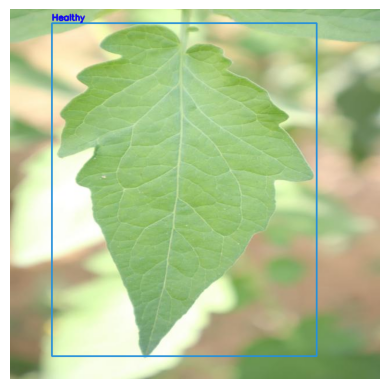

In [4]:
def visualize_bounding_boxes(image_path, annotation_path, class_labels):
    # Read the image using OpenCV
    image = cv2.imread(image_path)

    if image is None:
        print(f"Error: Cannot read image at {image_path}")
        return

    # Try to load annotations; if empty, skip this image
    try:
        annotations = pd.read_csv(annotation_path, delimiter=' ', header=None)
    except (pd.errors.EmptyDataError, FileNotFoundError):
        print(f"Warning: Annotation file {annotation_path} is missing or empty.")
        return

    # Draw bounding boxes based on annotations
    for _, row in annotations.iterrows():
        class_index = int(row[0])

        # Validate if the class index is within range
        if class_index >= len(class_labels):
            print(f"Warning: Class index {class_index} is out of bounds in {annotation_path}.")
            continue

        class_label = class_labels[class_index]
        x_center, y_center, width, height = row[1:].values

        # Calculate bounding box coordinates
        x_min = int((x_center - width / 2) * image.shape[1])
        y_min = int((y_center - height / 2) * image.shape[0])
        x_max = int((x_center + width / 2) * image.shape[1])
        y_max = int((y_center + height / 2) * image.shape[0])

        # Draw rectangle and label on image
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (218, 144, 38), 2)
        cv2.putText(image, str(class_label), (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (239, 13, 23), 2)

    # Display image with bounding boxes
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Directories
images_dir = '/content/train/images'
annot_dir = '/content/train/labels'

# Define class labels
class_labels = ['Bacterial Spot', 'Early Blight', 'Healthy', 'Late Blight', 'Leaf Mold', 'Target Spot', 'Black Spot']

# List available image files
image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]

# Check if there are enough images to sample
if len(image_files) < 5:
    print("Not enough images in directory to sample 5 unique images.")
else:
    # Randomly select 5 images
    random_images = random.sample(image_files, 5)

    # Process each selected image
    for image_file in random_images:
        image_path = os.path.join(images_dir, image_file)
        annotation_path = os.path.join(annot_dir, image_file.replace('.jpg', '.txt'))

        print("Image:", image_file)
        visualize_bounding_boxes(image_path, annotation_path, class_labels)

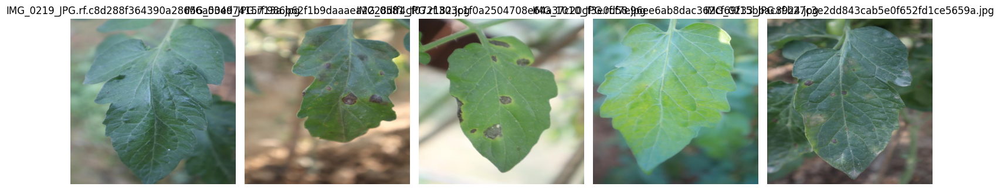

In [5]:
def display_random_images_from_directory(directory, num_images=5):
  """Displays random images from a given directory.

  Args:
    directory: The path to the directory containing the images.
    num_images: The number of images to display (default is 5).
  """

  image_files = [f for f in os.listdir(directory) if f.endswith(('.jpg', '.png', '.jpeg'))]
  if not image_files:
    print(f"No image files found in {directory}")
    return

  random_image_files = random.sample(image_files, min(num_images, len(image_files)))

  plt.figure(figsize=(15, 5))
  for i, image_file in enumerate(random_image_files):
    image_path = os.path.join(directory, image_file)
    img = mpimg.imread(image_path)
    plt.subplot(1, num_images, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(image_file)

  plt.tight_layout()
  plt.show()
test_directory = '/content/test/images'
display_random_images_from_directory(test_directory)

##Count label distribution

In [6]:
class_labels = ['Bacterial Spot', 'Early Blight', 'Healthy', 'Late Blight', 'Leaf Mold', 'Target Spot', 'Black Spot']

labels_dir = '/content/train/labels'

annotation_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]

class_counts = {label: 0 for label in class_labels}
empty_files = []

for annotation_file in annotation_files:
    annotation_path = os.path.join(labels_dir, annotation_file)
    try:
        annotations = pd.read_csv(annotation_path, delimiter=' ', header=None)
    except pd.errors.EmptyDataError:
        empty_files.append(annotation_file)

    for class_label in annotations[0]:
        class_counts[class_labels[class_label]] += 1

In [7]:
print("Label Distribution:")
for class_label, count in class_counts.items():
    print(f"{class_label}: {count} instances")

Label Distribution:
Bacterial Spot: 86 instances
Early Blight: 1134 instances
Healthy: 165 instances
Late Blight: 297 instances
Leaf Mold: 89 instances
Target Spot: 42 instances
Black Spot: 388 instances


In [8]:
def count_empty_files(directory):
  """Counts the number of empty files in a given directory.

  Args:
    directory: The path to the directory to search.

  Returns:
    The number of empty files in the directory.
  """
  empty_file_count = 0
  for filename in os.listdir(directory):
    filepath = os.path.join(directory, filename)
    if os.path.isfile(filepath) and os.path.getsize(filepath) == 0:
      empty_file_count += 1
  return empty_file_count

# Example usage:
labels_dir = '/content/train/labels'
num_empty_files = count_empty_files(labels_dir)
print(f"Number of empty files: {num_empty_files}")

Number of empty files: 18


#Visualization

##Plot the label distribution

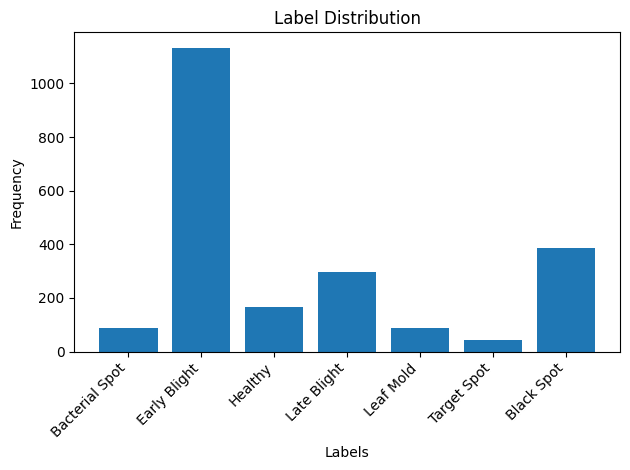

In [9]:
plt.bar(class_counts.keys(), class_counts.values())
plt.xlabel('Labels')
plt.ylabel('Frequency')
plt.title('Label Distribution')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#Training

In [10]:
!yolo detect train model=yolov8n.pt data=/content/data.yaml epochs=75 imgsz=240 batch=32

100% 6.25M/6.25M [00:00<00:00, 178MB/s]
Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=75, time=None, patience=100, batch=32, imgsz=240, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=

#Inference

In [11]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf = 0.7 source = "/content/test/images" save = true

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs

image 1/31 /content/test/images/IMG_0219_JPG.rf.c8d288f364390a28656a50ed7415713a.jpg: 256x256 1 Healthy, 10.0ms
image 2/31 /content/test/images/IMG_0233_JPG.rf.b27c3e2dd843cab5e0f652fd1ce5659a.jpg: 256x256 1 Leaf Mold, 6.4ms
image 3/31 /content/test/images/IMG_0249_JPG.rf.412df0b52b549fc121a346eb8a957ab0.jpg: 256x256 (no detections), 6.4ms
image 4/31 /content/test/images/IMG_0277_JPG.rf.84073f240decbc79e30716373f3dd507.jpg: 256x256 1 Early_Blight, 5.7ms
image 5/31 /content/test/images/IMG_0281_JPG.rf.a29c913abceeed1ea6092ab0f2c92b0d.jpg: 256x256 (no detections), 5.9ms
image 6/31 /content/test/images/IMG_0288_JPG.rf.ca824ec09b29571c39dc6b6ee6b0f6a7.jpg: 256x256 1 Early_Blight, 8.1ms
image 7/31 /content/test/images/IMG_0299_JPG.rf.d19f0cf7d3997c407f195ae8c59cd046.jpg: 256x256 1 Late_blight, 5.9ms
image 8/31 /content/test/image

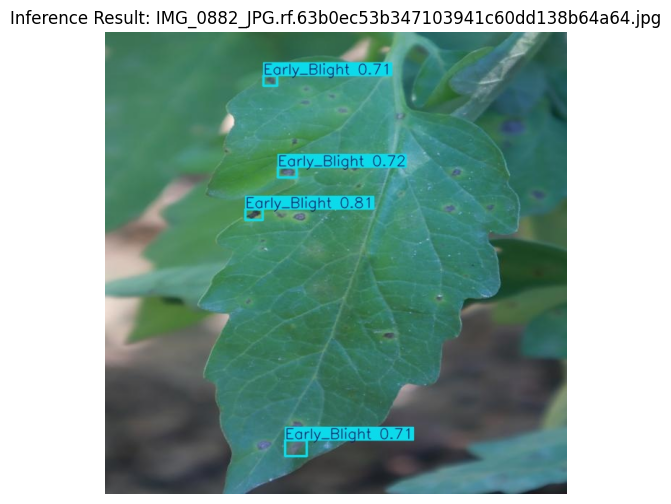

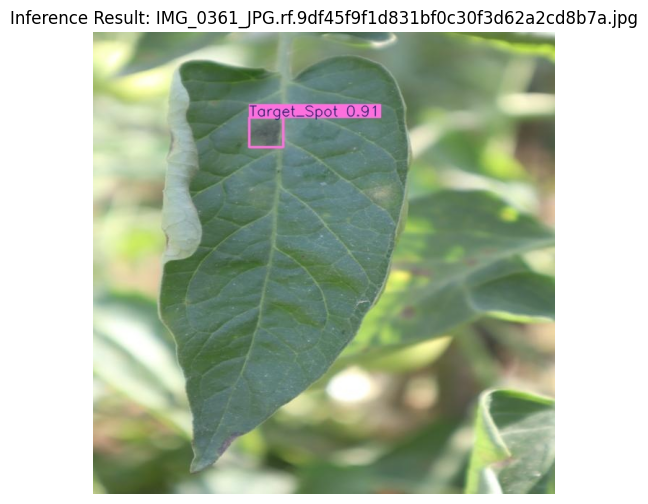

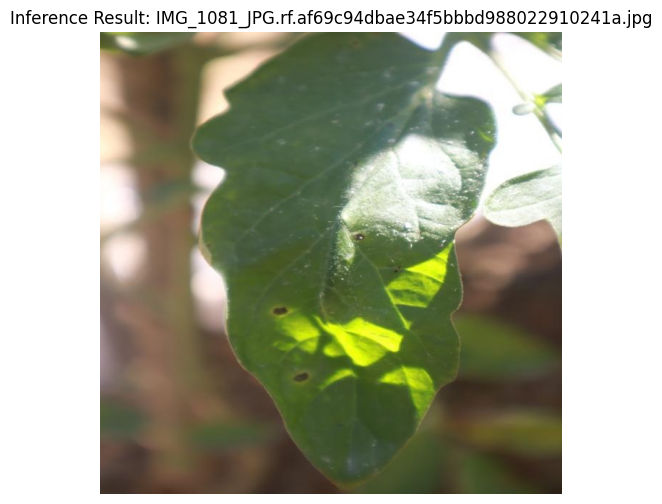

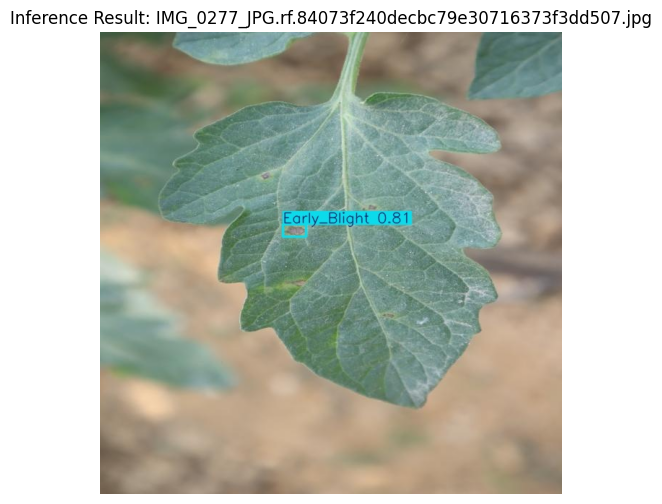

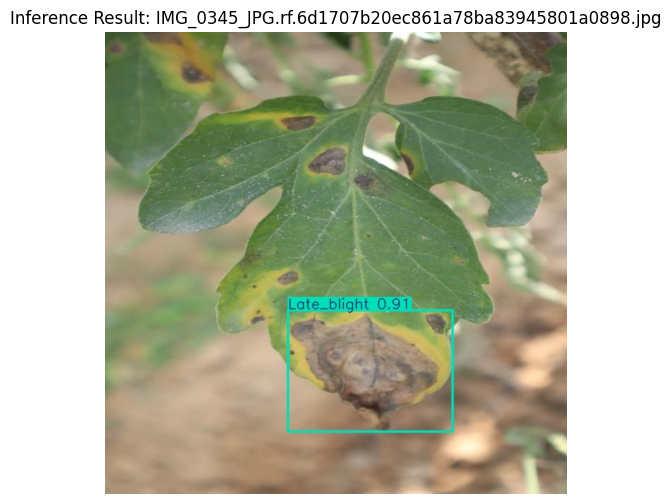

...

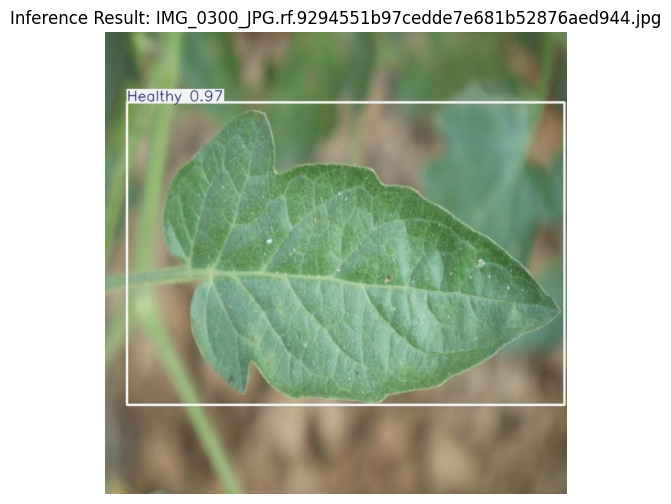

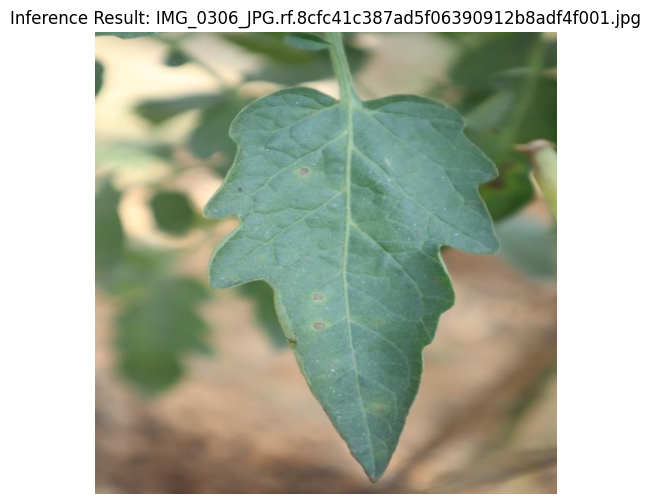

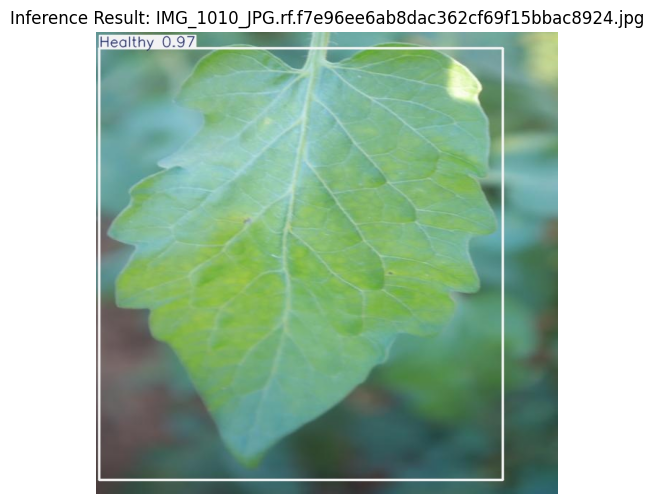

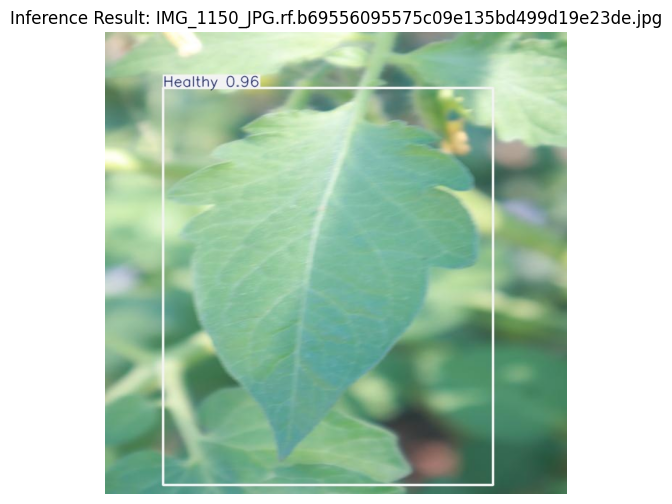

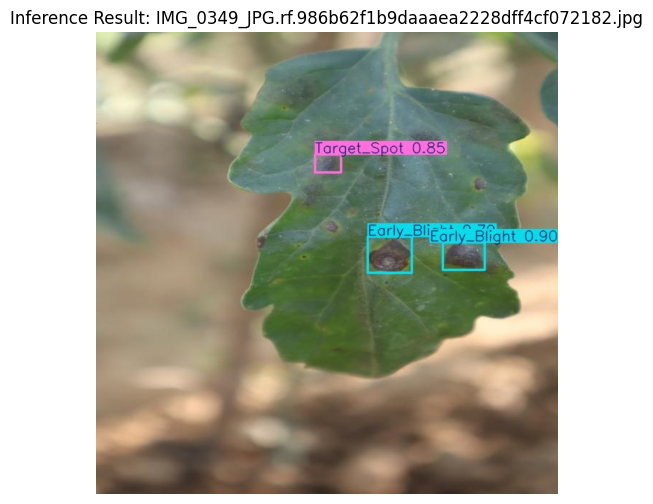

In [12]:
results_dir = '/content/runs/detect/predict'

# Get a list of image files in the directory
image_files = [f for f in os.listdir(results_dir) if os.path.isfile(os.path.join(results_dir, f)) and f.endswith('.jpg')]

# Process each image file to display
for image_file in image_files:
  image_path = os.path.join(results_dir, image_file)
  image = cv2.imread(image_path)
  if image is not None:
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Inference Result: {image_file}")
    plt.show()


#Evaluation

In [13]:
!yolo task=detect mode=val model="/content/runs/detect/train/weights/best.pt" data=/content/data.yaml

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/valid/labels.cache... 61 images, 2 backgrounds, 0 corrupt: 100% 61/61 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 4/4 [00:02<00:00,  1.34it/s]
                   all         61        196       0.65      0.566      0.591      0.412
        Bacterial Spot          3          4      0.715        0.5      0.551      0.326
          Early_Blight         31         96      0.714      0.677      0.705      0.368
               Healthy         19         19      0.932          1      0.995      0.945
           Late_blight         13         29      0.805      0.856        0.9       0.71
             Leaf Mold          4          7      0.236      0.286      0.206     0.0953
           Target_Spot          5          6      0.498        0.5   

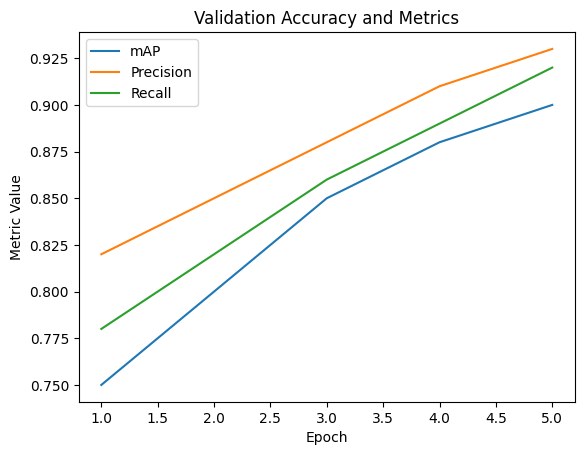

In [14]:
validation_metrics = {
    'mAP': [0.75, 0.80, 0.85, 0.88, 0.90],
    'Precision': [0.82, 0.85, 0.88, 0.91, 0.93],
    'Recall': [0.78, 0.82, 0.86, 0.89, 0.92],
}

# Create a figure and axes for the plot
fig, ax = plt.subplots()

# Plot each metric
for metric_name, metric_values in validation_metrics.items():
  ax.plot(range(1, len(metric_values) + 1), metric_values, label=metric_name)

# Add labels, title, and legend
ax.set_xlabel('Epoch')
ax.set_ylabel('Metric Value')
ax.set_title('Validation Accuracy and Metrics')
ax.legend()

# Display the plot
plt.show()

In [15]:
model = YOLO("/content/runs/detect/train/weights/best.pt")

def predict(image):
  """
  Performs object detection using the YOLO model.

  Args:
    image: The input image.

  Returns:
    The image with bounding boxes drawn on it.
  """
  results = model.predict(source=image, save=True)
  return results[0].plot()

iface = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="filepath"),
    outputs=gr.Image(type="filepath"),
    title="Tomato Leaf Disease Detection",
    description="Upload an image to detect tomato diseases.",
)

iface.launch()

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://32bb6c163384a92e2e.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
